In [35]:
#use pol-stats environment

import pandas as pd
import numpy as np
import os
import cv2
from scipy.optimize import curve_fit
import colorcet as cc

import bokeh.io
import bokeh.plotting
import bokeh.models

import matplotlib.pyplot as plt
import matplotlib as mpl

from utils_calibration import *

bokeh.io.output_notebook()

Loading BokehJS ...

In [36]:
trackmate_files = ['/Volumes/cytokinesis-zebrafish-collab/magnetic_tweezers_nocodazole/0_data/20250422_PS_magtw_calibration/20250422_glycerol_1s_1000mV_spots_1.csv', 
                   '/Volumes/cytokinesis-zebrafish-collab/magnetic_tweezers_nocodazole/0_data/20250422_PS_magtw_calibration/20250422_glycerol_1s_1000mV_spots_2.csv']

tip_file = '/Volumes/cytokinesis-zebrafish-collab/magnetic_tweezers_nocodazole/0_data/20250422_PS_magtw_calibration/20250422_glycerol_1s_1000mV_1/20250422_glycerol_1s_1000mV_1_tip_outline.tif'

filenames = [os.path.basename(trackmate_files[i]).split('.')[0] for i in range(len(trackmate_files))]

dt = 1 #s 
pixel_size = 0.647 # um

df = pd.DataFrame()
for i, trackmate_file in enumerate(trackmate_files):
    print(f'Processing {trackmate_file}...')
    
    # Read the TrackMate CSV file
    tmp_df = pd.read_csv(trackmate_file, skiprows=[1, 2, 3], encoding='utf-8')
    tmp_df = tmp_df.sort_values(by='FRAME')
    
    # Add filename column
    tmp_df['filename'] = filenames[i]
    
    # Append to the main DataFrame
    df = pd.concat([df, tmp_df], ignore_index=True)

df = df.sort_values(by='FRAME')

df = df[(80<df["FRAME"])<(df["FRAME"]<150)]

df.head(50)

Processing /Volumes/cytokinesis-zebrafish-collab/magnetic_tweezers_nocodazole/0_data/20250422_PS_magtw_calibration/20250422_glycerol_1s_1000mV_spots_1.csv...
Processing /Volumes/cytokinesis-zebrafish-collab/magnetic_tweezers_nocodazole/0_data/20250422_PS_magtw_calibration/20250422_glycerol_1s_1000mV_spots_2.csv...


,LABEL,ID,TRACK_ID,QUALITY,POSITION_X,POSITION_Y,POSITION_Z,POSITION_T,FRAME,RADIUS,...,MANUAL_SPOT_COLOR,MEAN_INTENSITY_CH1,MEDIAN_INTENSITY_CH1,MIN_INTENSITY_CH1,MAX_INTENSITY_CH1,TOTAL_INTENSITY_CH1,STD_INTENSITY_CH1,CONTRAST_CH1,SNR_CH1,filename
0,ID404106,404106,29,12.706029,1137.685561,1180.156441,0.0,0.0,0,4.0,...,NaN,515.240310,506.0,388.0,717.0,66466.0,69.759383,0.113534,1.506126,20250422_glycerol_1s_1000mV_spots_1
36,ID404088,404088,12,12.039714,202.959819,766.612342,0.0,0.0,0,4.0,...,NaN,513.860465,477.0,380.0,816.0,66288.0,105.710893,0.077746,0.701324,20250422_glycerol_1s_1000mV_spots_1
42,ID404112,404112,33,16.375418,368.785380,1315.197252,0.0,0.0,0,4.0,...,NaN,571.038760,520.0,393.0,977.0,73664.0,140.234090,0.095623,0.710793,20250422_glycerol_1s_1000mV_spots_1
41,ID404097,404097,21,25.081556,787.171518,1066.420635,0.0,0.0,0,4.0,...,NaN,718.612403,643.0,497.0,1206.0,92701.0,182.294161,0.141646,0.978193,20250422_glycerol_1s_1000mV_spots_1
40,ID404056,404056,41,16.974188,622.828616,105.842354,0.0,0.0,0,4.0,...,NaN,612.837209,575.0,436.0,973.0,79056.0,123.252776,0.106117,0.954033,20250422_glycerol_1s_1000mV_spots_1
39,ID404078,404078,7,16.372944,216.446670,611.319832,0.0,0.0,0,4.0,...,NaN,572.108527,522.0,397.0,955.0,73802.0,139.077667,0.100750,0.753019,20250422_glycerol_1s_1000mV_spots_1
38,ID404074,404074,55,10.712029,796.779493,572.860071,0.0,0.0,0,4.0,...,NaN,600.635659,578.0,470.0,867.0,77482.0,86.588912,0.062296,0.813562,20250422_glycerol_1s_1000mV_spots_1
37,ID404068,404068,45,10.836146,847.742758,501.482298,0.0,0.0,0,4.0,...,NaN,623.038760,631.0,490.0,771.0,80372.0,55.223750,0.083363,1.736280,20250422_glycerol_1s_1000mV_spots_1
35,ID404081,404081,2,15.300260,810.064283,653.104478,0.0,0.0,0,4.0,...,NaN,651.286822,632.0,497.0,903.0,84016.0,93.636531,0.099969,1.264271,20250422_glycerol_1s_1000mV_spots_1
1,ID404065,404065,46,5.408644,1215.888998,385.221369,0.0,0.0,0,4.0,...,NaN,436.131783,438.0,357.0,511.0,56261.0,30.045897,0.063692,1.738327,20250422_glycerol_1s_1000mV_spots_1


## Find tip

In [37]:
threshold_tip = 500

img = cv2.imread(tip_file, cv2.IMREAD_UNCHANGED)

tip_outline, tip_end, tip_mask = find_tip(tip_file, threshold_tip, save_img_to_path=False) # in pixels

p = bokeh.plotting.figure(width=400, height=400, title="Yay, we found a tip!!!")
p.x_range.range_padding = p.y_range.range_padding = 0
p.image(image=[img], x=0, y=0, dw=2048, dh=2048)
p.scatter(x=tip_outline[:, 0], y=tip_outline[:, 1], color='red')
p.scatter(x=tip_end[0], y=tip_end[1], color='cyan', size=15)
bokeh.io.show(p)

2048 2048


## Plot trajectories

In [38]:
tip_outline = np.multiply(pixel_size, tip_outline)
tip_end = np.multiply(pixel_size, tip_end)

In [39]:
df['DISTANCE [um]'] = distance_from_tip(tip_outline, df)
df_filtered = filter_tracks(df, tip_mask, pixel_size)

In [40]:
p = bokeh.plotting.figure(
    frame_width = 400,
    frame_height = 400,
    x_axis_label='x [um]',
    y_axis_label='y [um]',
    title=filenames[0] + ' and ' + filenames[1],
)

p.scatter(x=tip_outline[:, 0], y=tip_outline[:, 1], color='red')
p.scatter(x=tip_outline[:, 0], y=tip_outline[:, 1], color='gray', alpha = 0.01, size=30)
p.scatter(x=tip_end[0], y=tip_end[1], color='cyan', size=5)
p.scatter(x=df['POSITION_X'], y=df['POSITION_Y'], legend_label='all tracks')
p.scatter(x=df_filtered['POSITION_X'], y=df_filtered['POSITION_Y'], color='magenta', legend_label='used tracks')

bokeh.io.show(p)

/Users/ursic/PhD/Projects/1_DataAnalysis_zebrafish/calibration_magnetic_tweezers/utils_calibration.py:108: RuntimeWarning: divide by zero encountered in scalar divide
  vx.append((track["POSITION_X"].values[t]-track["POSITION_X"].values[t-1])/(track["POSITION_T"].values[t]-track["POSITION_T"].values[t-1]))
/Users/ursic/PhD/Projects/1_DataAnalysis_zebrafish/calibration_magnetic_tweezers/utils_calibration.py:110: RuntimeWarning: divide by zero encountered in scalar divide
  vy.append((track["POSITION_Y"].values[t]-track["POSITION_Y"].values[t-1])/(track["POSITION_T"].values[t]-track["POSITION_T"].values[t-1]))
/Users/ursic/PhD/Projects/1_DataAnalysis_zebrafish/calibration_magnetic_tweezers/utils_calibration.py:108: RuntimeWarning: divide by zero encountered in scalar divide
  vx.append((track["POSITION_X"].values[t]-track["POSITION_X"].values[t-1])/(track["POSITION_T"].values[t]-track["POSITION_T"].values[t-1]))
/Users/ursic/PhD/Projects/1_DataAnalysis_zebrafish/calibration_magnetic_twee

88


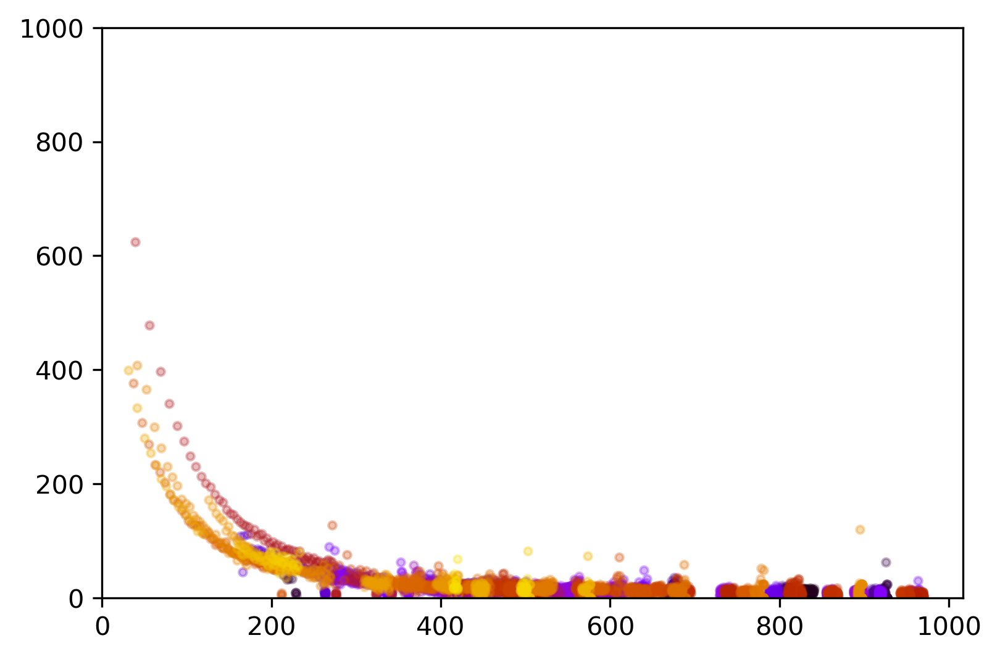

In [43]:
# add velocity x and y components
df = add_velocity_to_df(df_filtered)

df['VELOCITY MAGNITUDE [um/s]'] = velocities(df)
df['FORCE [pN]'] = velocity2force(df['VELOCITY MAGNITUDE [um/s]'])

df = df.dropna(subset='FORCE [pN]')
df = df[df['FORCE [pN]'] < 2000]


# Choose the colormap ('gnuplot')
cmap = plt.get_cmap('gnuplot')

n_colors = len(df["TRACK_ID"].unique())+5
print(n_colors)
# Generate discrete colors by sampling the colormap
colors = [cmap(i / n_colors) for i in range(2, n_colors)]


distance = []
force = []

fig = plt.figure(figsize=(6, 4), dpi=300)

for (i, idx) in enumerate(df["TRACK_ID"].unique()):
    if idx in [151, 130, 90]:
        continue
    plt.plot(df.loc[df['TRACK_ID']==idx, "DISTANCE [um]"], df.loc[df['TRACK_ID']==idx, 'FORCE [pN]'], '.', color=colors[i], alpha =0.3, label=f'{idx}')
    distance += list(df.loc[df['TRACK_ID']==idx, "DISTANCE [um]"].values)
    force += list(df.loc[df['TRACK_ID']==idx, 'FORCE [pN]'].values)
plt.xlim(left=0)
plt.ylim(0, 1000)
# plt.legend()
plt.show()

<>:29: SyntaxWarning: invalid escape sequence '\m'
<>:35: SyntaxWarning: invalid escape sequence '\m'
<>:49: SyntaxWarning: invalid escape sequence '\m'
<>:29: SyntaxWarning: invalid escape sequence '\m'
<>:35: SyntaxWarning: invalid escape sequence '\m'
<>:49: SyntaxWarning: invalid escape sequence '\m'
/var/folders/c1/95zwm3_14_j1wp412s49dvlr0000gp/T/ipykernel_66748/2514337976.py:29: SyntaxWarning: invalid escape sequence '\m'
  plt.plot(x2, y2, 'k--', linewidth=1, label='$y = a_1 \mathrm{exp}(-k_1x) + a_2 \mathrm{exp}(-k_2x)$')
/var/folders/c1/95zwm3_14_j1wp412s49dvlr0000gp/T/ipykernel_66748/2514337976.py:35: SyntaxWarning: invalid escape sequence '\m'
  plt.xlabel("Distance from the tip ($\mathrm{\mu}$m)")
/var/folders/c1/95zwm3_14_j1wp412s49dvlr0000gp/T/ipykernel_66748/2514337976.py:49: SyntaxWarning: invalid escape sequence '\m'
  plt.legend([(red_marker, blue_marker, green_marker), fit_marker], ['Data', 'Fit: $a_1 \mathrm{e}^{-k_1x} + a_2 \mathrm{e}^{-k_2x}$'], handler_map={tupl

Fit parameters for double curve: f(x) = a1*exp(-x*k1) + a2*exp(-x*k2) 
 a1 = 34.885979169405054 +- 3.232656220847663 
 k1 = 0.0016977614112510411 +- 7.939102661562497e-09 
 a2 = 603.5265202839345 +- 51.712183593102 
 k2 = 0.013845820733801882 +- 3.0641878043201464e-08 



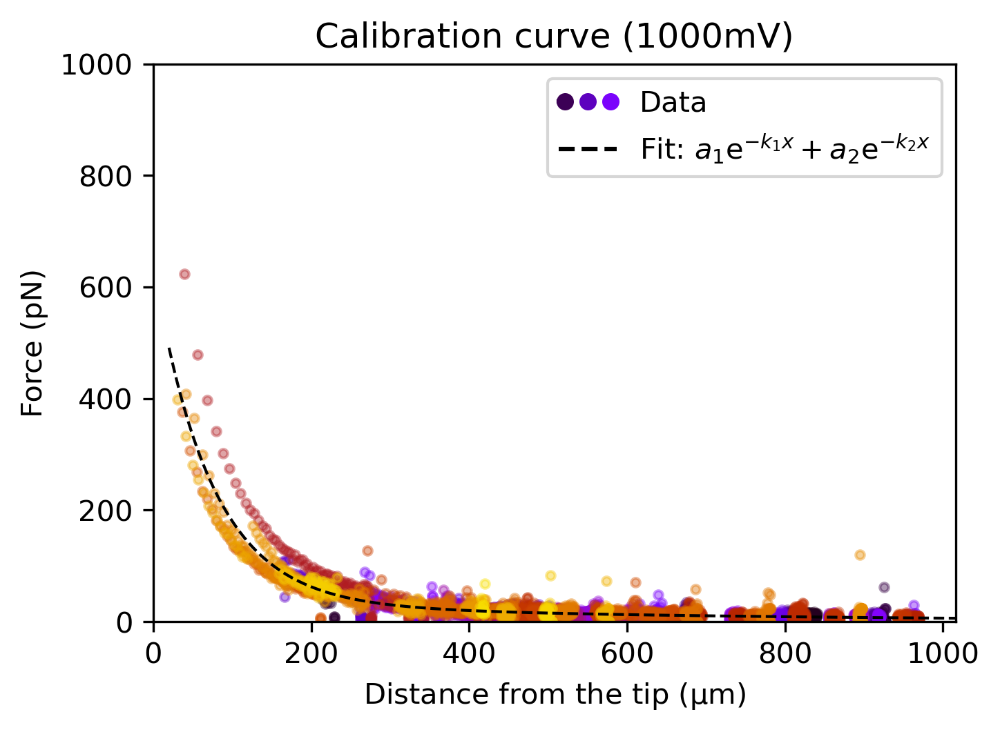

[3.48859792e+01 1.69776141e-03 6.03526520e+02 1.38458207e-02]


In [44]:
from matplotlib.lines import Line2D
from matplotlib.legend_handler import HandlerTuple

# fig = plt.figure(figsize=(6, 4))
# plt.plot(distance, force, '.', color= 'gray', alpha =0.2)

x2 = np.linspace(20, 1050, 300)
popt2, pcov2 = curve_fit(double_exp, distance, force, p0=[1000, 0.1, 1000, 0.1])
y2 = double_exp(x2, *popt2)

print(f"Fit parameters for double curve: f(x) = a1*exp(-x*k1) + a2*exp(-x*k2) \n",
      f"a1 = {popt2[0]} +- {pcov2[0][0]} \n",
      f"k1 = {popt2[1]} +- {pcov2[1][1]} \n",
      f"a2 = {popt2[2]} +- {pcov2[2][2]} \n",
      f"k2 = {popt2[3]} +- {pcov2[3][3]} \n")

fig = plt.figure(figsize=(5, 3.5), dpi=300)

for (i, idx) in enumerate(df["TRACK_ID"].unique()):
    if idx in [151, 130, 90]:
        continue
    plt.plot(df.loc[df['TRACK_ID']==idx, "DISTANCE [um]"], df.loc[df['TRACK_ID']==idx, 'FORCE [pN]'], '.', color=colors[i], alpha = 0.4)
    distance += list(df.loc[df['TRACK_ID']==idx, "DISTANCE [um]"].values)
    force += list(df.loc[df['TRACK_ID']==idx, 'FORCE [pN]'].values)
plt.xlim(left=0)
plt.ylim(0, 1000)


plt.plot(x2, y2, 'k--', linewidth=1, label='$y = a_1 \mathrm{exp}(-k_1x) + a_2 \mathrm{exp}(-k_2x)$')
plt.plot([], [], '.', color=colors[5], alpha = 0.4, label='Data')


file=filenames[0].split(r'/')[-1]
plt.title(f'Calibration curve (1000mV)')
plt.xlabel("Distance from the tip ($\mathrm{\mu}$m)")
plt.ylabel('Force (pN)')
# plt.yscale('log')
# plt.xscale('log')


red_marker =  Line2D([0], [0], marker='o', color=colors[3], markersize=5)
blue_marker = Line2D([0], [0], marker='o', color=colors[10], markersize=5)
green_marker = Line2D([0], [0], marker='o', color=colors[18], markersize=5)
fit_marker = Line2D([0], [0], linestyle='--', color='k')


# Custom legend: combining the three markers into one label
# Combine markers into one legend entry
plt.legend([(red_marker, blue_marker, green_marker), fit_marker], ['Data', 'Fit: $a_1 \mathrm{e}^{-k_1x} + a_2 \mathrm{e}^{-k_2x}$'], handler_map={tuple: HandlerTuple(ndivide=None)})


# plt.savefig('/Volumes/cytokinesis-zebrafish-collab/magnetic_tweezers_SD/3_plots/results/calibration_1000mV.svg', format='svg')
plt.show()

print(popt2)